# Section one: Getting refined coordinates:

In [3]:
# numpy
import numpy as np
from numpy import unravel_index
print( 'Using numpy version %s' % np.__version__ )

# matplotlib and inline display in notebook
import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib inline
print( 'Using matplotlib version %s' % mpl.__version__ )

# matplotlib toolkits
from mpl_toolkits.axes_grid1 import make_axes_locatable
from mpl_toolkits.axes_grid1.inset_locator import inset_axes



import photutils

from astropy.io import fits

from astropy.wcs import WCS
import astropy.units as u
from astropy.coordinates import SkyCoord

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
%matplotlib inline

from photutils.aperture import SkyCircularAperture, SkyCircularAnnulus, aperture_photometry
# scipy
import scipy as scp
from scipy.ndimage import label
from scipy.interpolate import interp1d
from scipy.stats import sigmaclip, iqr
print( 'Using scipy version %s' % scp.__version__ )

# system
import glob, os

# astropy
import astropy as astro
from astropy.table import Table
from astropy.io import ascii, fits
from astropy.stats import sigma_clip
import astropy.units as u
from astropy.cosmology import Planck15
from astropy.convolution import convolve_fft, Box2DKernel
from astropy.coordinates import SkyCoord
from astropy.nddata.utils import Cutout2D
from astropy.wcs import WCS
print( 'Using astropy version %s' % astro.__version__ )

# photutils
import photutils as phot
from photutils import EllipticalAperture, EllipticalAnnulus, aperture_photometry, CircularAnnulus, CircularAperture, SkyEllipticalAnnulus, SkyEllipticalAperture, SkyCircularAperture, SkyCircularAnnulus
from photutils.detection import DAOStarFinder
print( 'Using photutils version %s' % phot.__version__ )

# text below modifies matplotlib settings so LaTeX can be used in plots
params = {'text.usetex': False, 'mathtext.fontset': 'stixsans'}
plt.rcParams.update(params)



Using numpy version 1.25.2
Using matplotlib version 3.6.0
Using scipy version 1.11.3
Using astropy version 6.0.1
Using photutils version 1.12.0


/var/folders/by/26kj85kd3w94p3xv_m2206b40000gn/T/ipykernel_9782/1483311193.py:58: DeprecationWarning: `photutils.EllipticalAperture` is a deprecated alias for `photutils.aperture.EllipticalAperture` and will be removed in the future. Instead, please use `from photutils.aperture import EllipticalAperture` to silence this warning.
  from photutils import EllipticalAperture, EllipticalAnnulus, aperture_photometry, CircularAnnulus, CircularAperture, SkyEllipticalAnnulus, SkyEllipticalAperture, SkyCircularAperture, SkyCircularAnnulus
/var/folders/by/26kj85kd3w94p3xv_m2206b40000gn/T/ipykernel_9782/1483311193.py:58: DeprecationWarning: `photutils.EllipticalAnnulus` is a deprecated alias for `photutils.aperture.EllipticalAnnulus` and will be removed in the future. Instead, please use `from photutils.aperture import EllipticalAnnulus` to silence this warning.
  from photutils import EllipticalAperture, EllipticalAnnulus, aperture_photometry, CircularAnnulus, CircularAperture, SkyEllipticalAnnul

In [4]:
# Load the catalog
clump_catalog_path = '/Users/neal/Documents/PhD/projects/SED-fitting/Clump/results/catalog_n/goodsslast.csv'
clump_catalog = pd.read_csv(clump_catalog_path)

### 1) Load images and select bandpass:

In [7]:
def load_image(galaxy_id, band, base_path='/Users/neal/Documents/PhD/projects/SED-fitting/Clump/Cutouts_galaxies'):
    file_name = f'{base_path}/goodss_{galaxy_id}_{band}_images.fits'
    with fits.open(file_name) as hdul:
        image_data = hdul[0].data
        wcs = WCS(hdul[0].header)  # Extract the WCS information from the header
    return image_data, wcs

def get_band_from_redshift(z):
    if 0.5 <= z < 1:
        return 'f275w'
    elif 1 <= z < 2:
        return 'f435w'
    elif 2 <= z <= 3:
        return 'f606w'
    else:
        raise ValueError("Redshift out of bounds for band selection")

### 2) aperture and mask:

In [8]:
def apply_mask(image_data, wcs, ra_clump, dec_clump):
    target_coords = SkyCoord(ra=ra_clump, dec=dec_clump, unit='deg')
    target_aperture = SkyCircularAperture(target_coords, r=0.18 * u.arcsec).to_pixel(wcs)
    mask = target_aperture.to_mask(method='center')
    masked_image = mask.to_image(image_data.shape)

    #2nd iteration: adding mas clumped

    # Enhance image by subtracting the smoothed image
    smooth_kernel = Box2DKernel(width=10)
    smooth_img = convolve_fft(image_data, smooth_kernel)
    contrast_img = image_data - smooth_img

    # Finding sources using DAOStarFinder
    daofind = DAOStarFinder(fwhm=2.0, threshold=3*np.median(masked_image * image_data))
    sources = daofind(masked_image * image_data)
    if sources is not None and len(sources) > 0:
        idx = np.argmax(sources['peak'])
        return sources['xcentroid'][idx], sources['ycentroid'][idx] #,masked_image, contrast_img
    return None, None #masked_image, contrast_img### added last two

### 4)process each clump

In [9]:
# Process each clump in the catalog
base_path = '/Users/neal/Documents/PhD/projects/SED-fitting/Clump/Cutouts_galaxies'
def process_clumps(dataframe, base_path):
    for index, row in dataframe.iterrows():
        if row['Clump_ID'] != -99:
            band = get_band_from_redshift(row['z'])
            image_data, wcs = load_image(row['CANDELS_ID'], band, base_path)
            x_new, y_new = apply_mask(image_data, wcs, row['RA_clump'], row['DEC_clump'])

            if x_new is not None and y_new is not None:
                dataframe.at[index, 'new_X_centroid'] = x_new
                dataframe.at[index, 'new_Y_centroid'] = y_new
                # print(f"Updated clump {row['Clump_ID']} at index {index} with new center: ({x_new}, {y_new})")
            else:
                print(f"No sources found for clump {row['Clump_ID']} at index {index}")
    return dataframe

In [10]:
goodss_result = process_clumps(clump_catalog, base_path)
goodss_result.to_csv('/Users/neal/Documents/PhD/projects/SED-fitting/Clump/results/newcenters_goodsslast.csv', index=False)


/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/pyth

No sources found for clump 3 at index 275


/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/pyth

No sources found for clump 1 at index 792


/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/pyth

No sources found for clump 3 at index 922
No sources found for clump 1 at index 928


/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/pyth

No sources found for clump 4 at index 1157


/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/pyth

No sources found for clump 1 at index 1202


/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/pyth

No sources found for clump 3 at index 1230


/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/pyth

No sources found for clump 1 at index 1449


/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/pyth

No sources found for clump 1 at index 1479


/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/pyth

No sources found for clump 1 at index 2056


/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/pyth

No sources found for clump 2 at index 2234
No sources found for clump 3 at index 2235


/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/pyth

No sources found for clump 1 at index 2311


/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/pyth

No sources found for clump 1 at index 2363


/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/pyth

No sources found for clump 11 at index 2392


/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/pyth

No sources found for clump 5 at index 2460


/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/pyth

No sources found for clump 2 at index 2603


/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/pyth

No sources found for clump 1 at index 2709


/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/pyth

No sources found for clump 5 at index 2822


/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/pyth

No sources found for clump 2 at index 2865


/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/pyth

No sources found for clump 7 at index 3007
No sources found for clump 1 at index 3027


/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/pyth

No sources found for clump 2 at index 3050
No sources found for clump 3 at index 3064


/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/pyth

No sources found for clump 7 at index 3540


/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/pyth

No sources found for clump 2 at index 3721


/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)
/Users/neal/anaconda3/lib/pyth

# Run it on first 20 clumps:

In [11]:
def process_clumps(dataframe, base_path):
    for index, row in dataframe.iterrows():
        if index >= 20:
            break  # Process only the first 20 entries
        if row['Clump_ID'] != -99:
            band = get_band_from_redshift(row['z'])
            image_data, wcs = load_image(row['CANDELS_ID'], band, base_path)
            target_coords = SkyCoord(row['RA_clump'], row['DEC_clump'], unit='deg')
            target_aperture = SkyCircularAperture(target_coords, r=0.18 * u.arcsec).to_pixel(wcs)
            
            # Apply mask and visualize
            mask = target_aperture.to_mask(method='center')
            masked_image = mask.to_image(image_data.shape)
            # masked_image= mask.multiply(image_data)

            # Enhance image for detection
            smooth_kernel = Box2DKernel(width=10)
            smooth_img = convolve_fft(image_data, smooth_kernel)
            contrast_img = image_data - smooth_img
            daofind = DAOStarFinder(fwhm=2.0, threshold=3*np.median(masked_image * image_data))
            sources = daofind(masked_image * image_data)

# Visualize the original image with aperture overlay
            plt.figure(figsize=(12, 6))
            plt.subplot(1, 2, 1)
            plt.imshow(np.arcsinh(image_data/0.01), origin='lower')
            target_aperture.plot(color='red', lw=1.5)
            plt.colorbar()
            plt.title("Original Image with Aperture")

            # Apply mask and visualize
            
            plt.subplot(1, 2, 2)
            plt.imshow(masked_image * image_data ,origin='lower')
            plt.colorbar()
            plt.title("Masked Image")
            plt.show()

            # Visualize detections in contrast image
            plt.figure(figsize=(10, 5))
            plt.imshow(masked_image * contrast_img, origin='lower')
            plt.colorbar()
            plt.title("Contrast Image with Detections")
            if sources is not None:
                max_peak_idx = np.argmax(sources['peak'])
                plt.scatter(sources['xcentroid'][max_peak_idx], sources['ycentroid'][max_peak_idx], color='red', s=10, edgecolor='white', label='Brightest Source')
                plt.legend()
            plt.show()
            # Update the DataFrame with new centroid coordinates, if sources detected
            if sources is not None and len(sources) > 0:
                idx_max = np.argmax(sources['peak'])
                dataframe.at[index, 'new_X_centroid'] = sources['xcentroid'][idx_max]
                dataframe.at[index, 'new_Y_centroid'] = sources['ycentroid'][idx_max]
                # print(f"Updated clump {row['Clump_ID']} at index {index} with new center: ({sources['xcentroid'][idx_max]}, {sources['ycentroid'][idx_max]})")
            else:
                print(f"No sources found for clump {row['Clump_ID']} at index {index}")

    return dataframe
    return dataframe


/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)


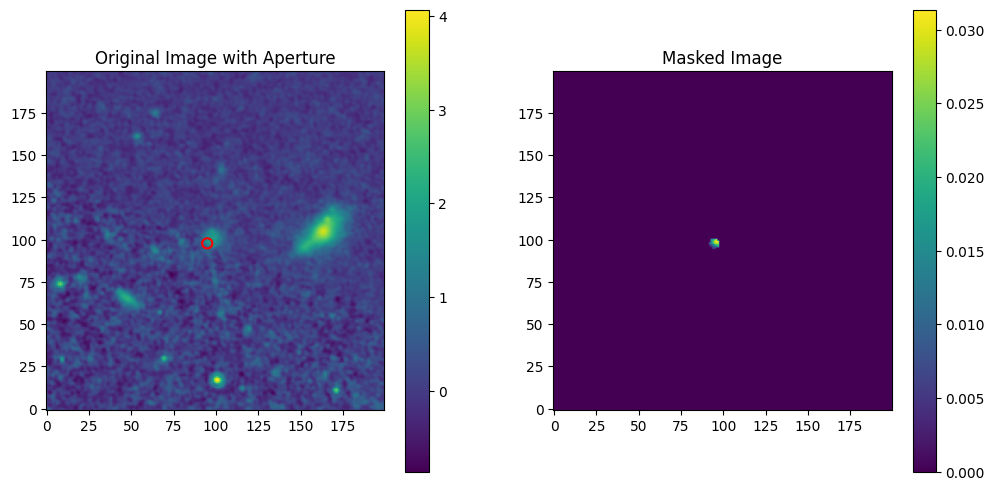

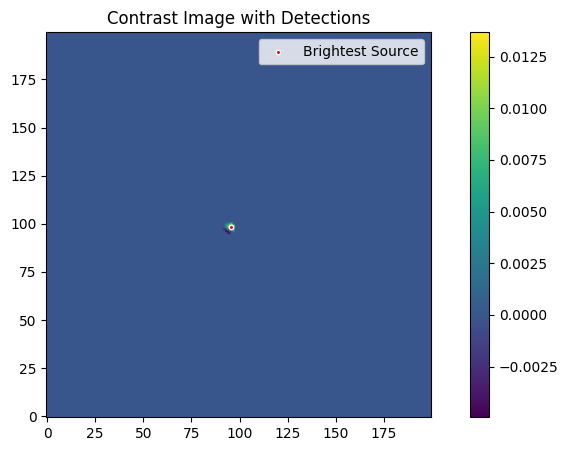

/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)


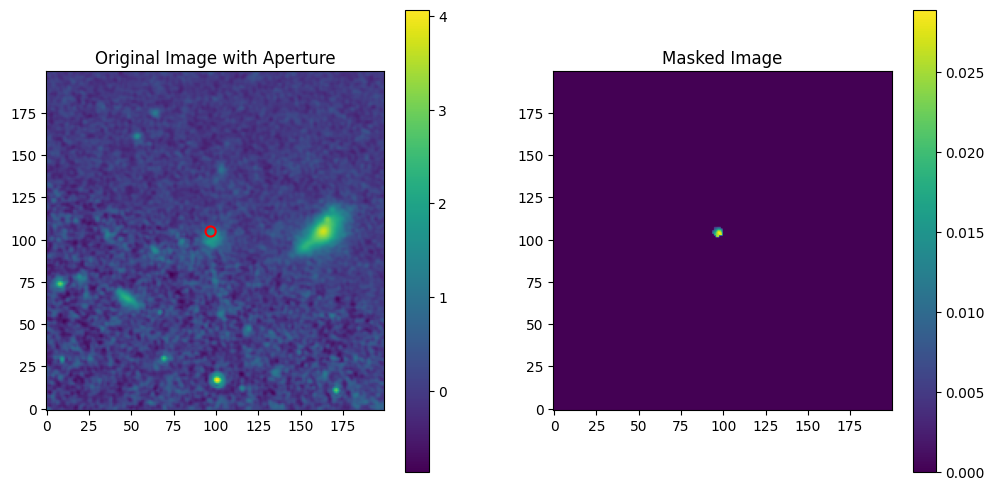

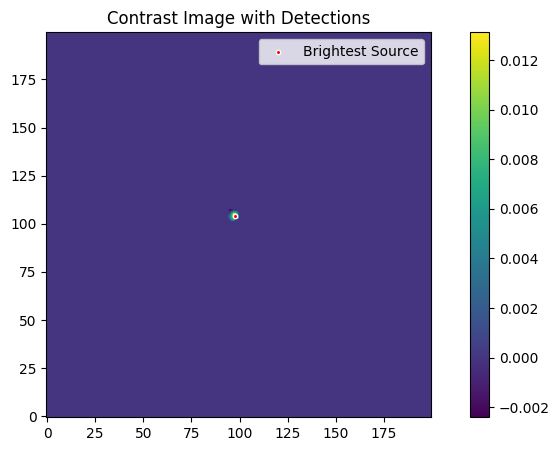

/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)


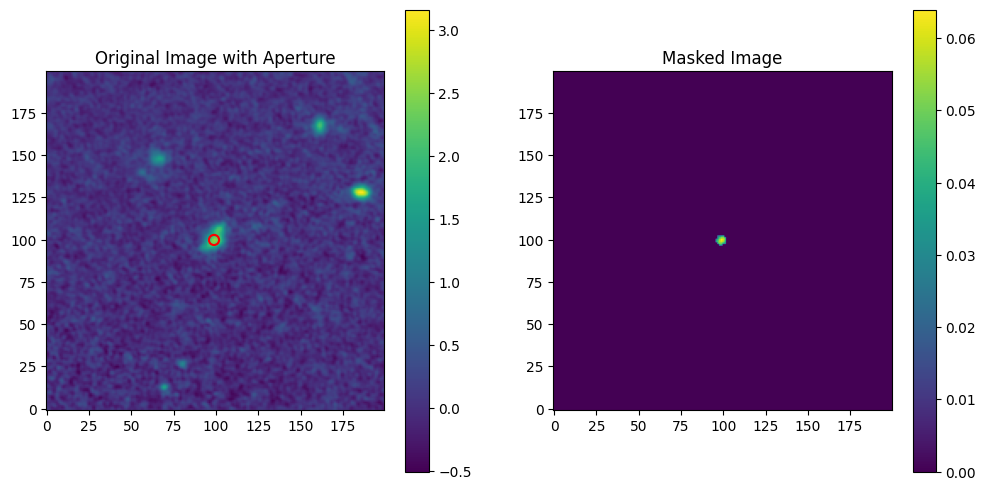

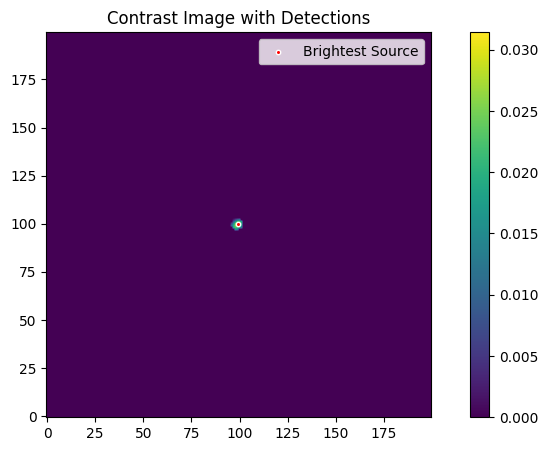

/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)


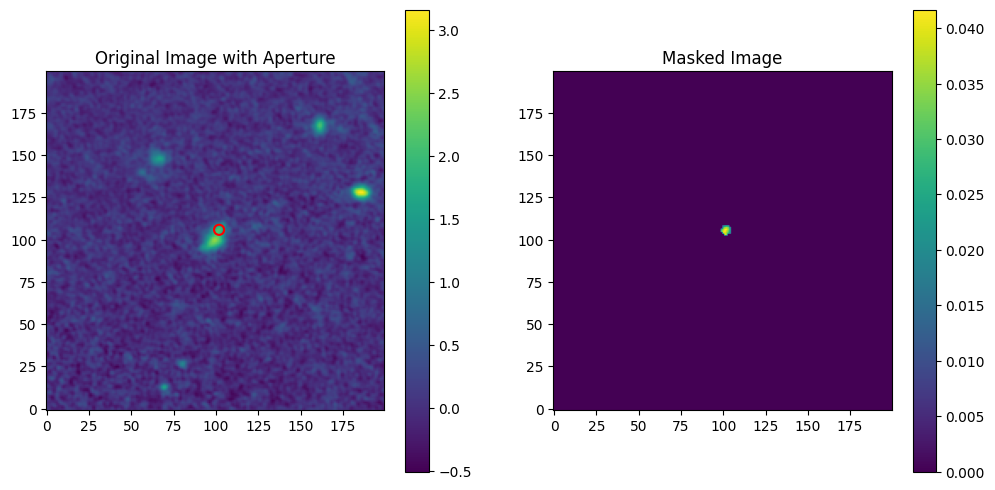

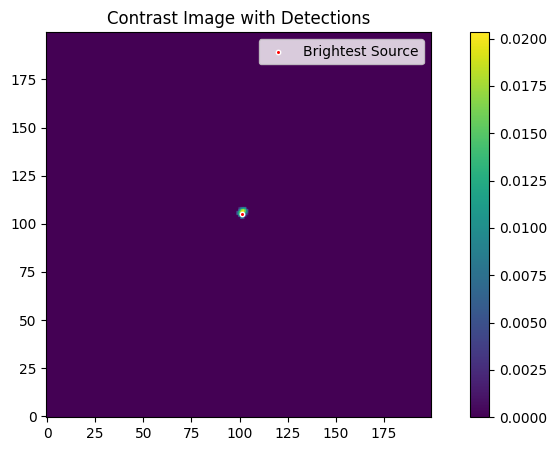

/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)


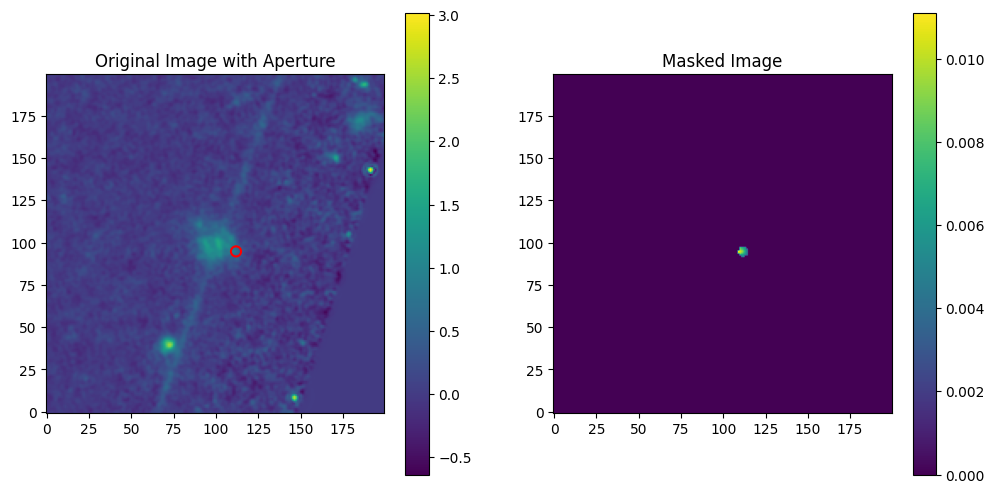

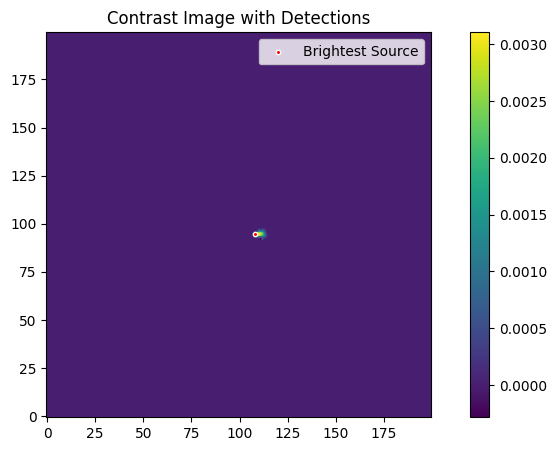

/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)


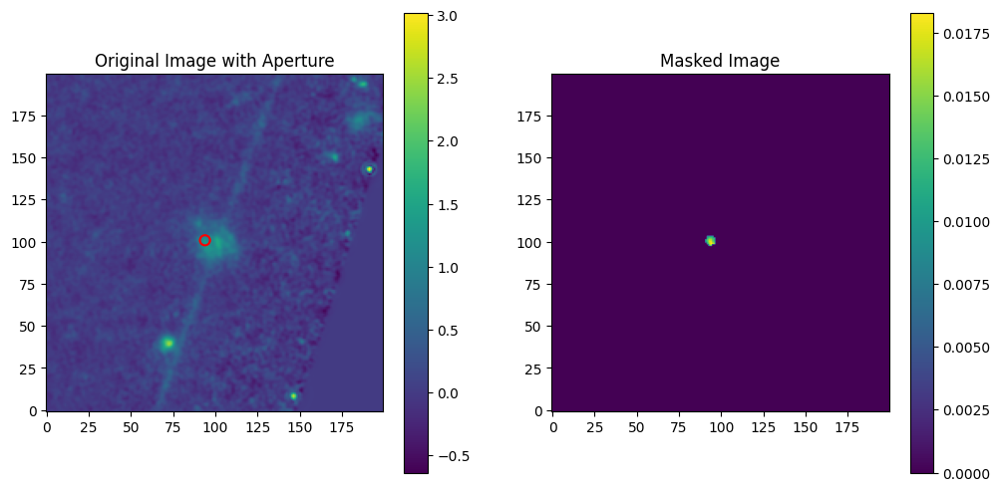

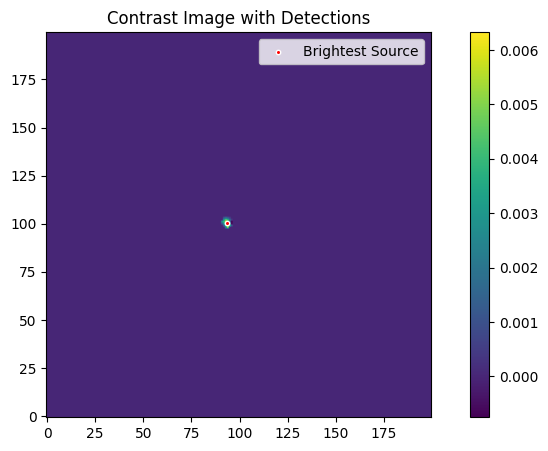

/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)


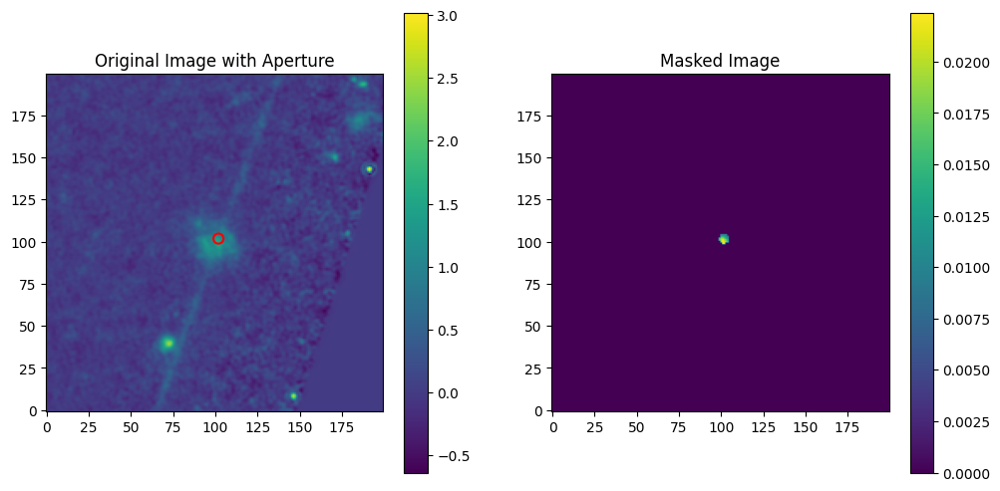

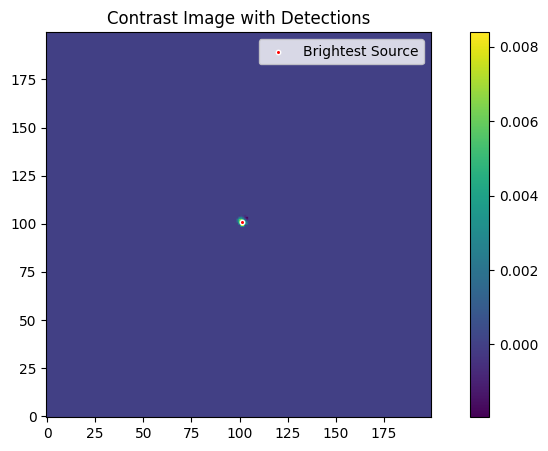

/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)


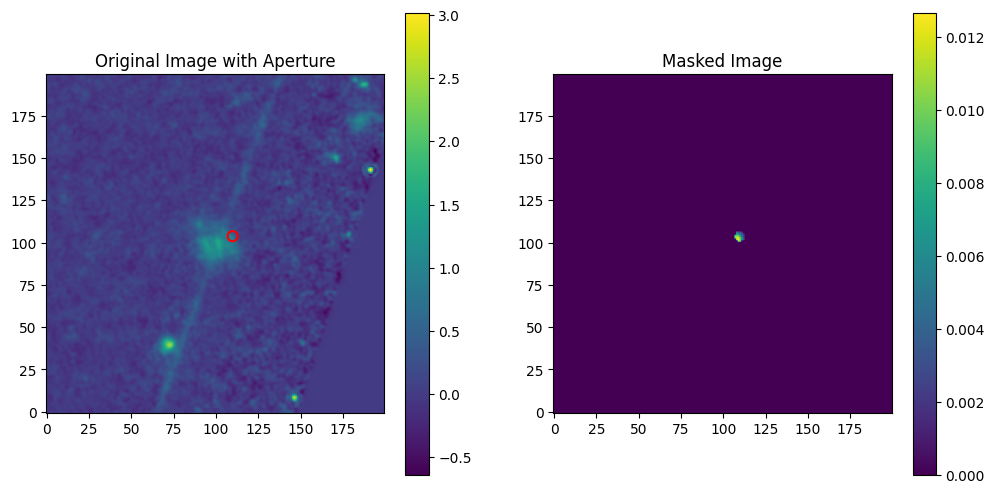

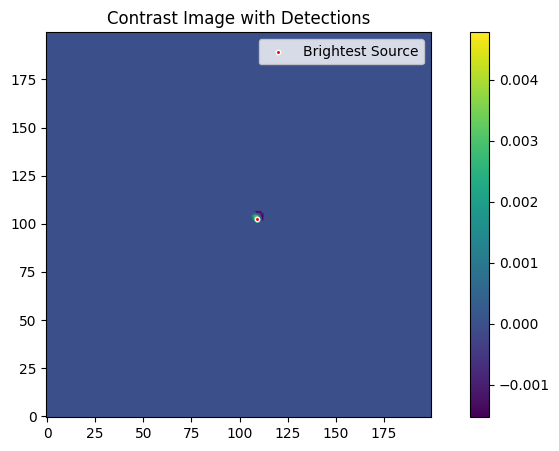

/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)


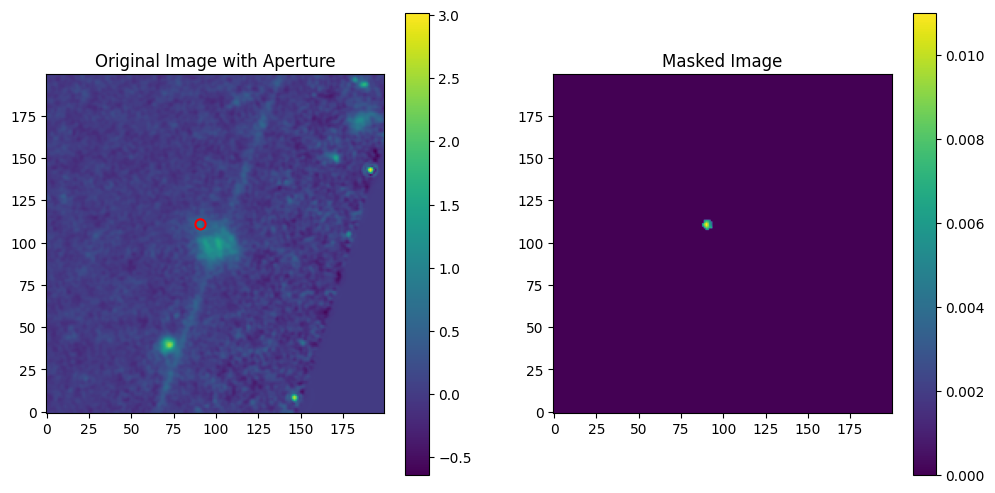

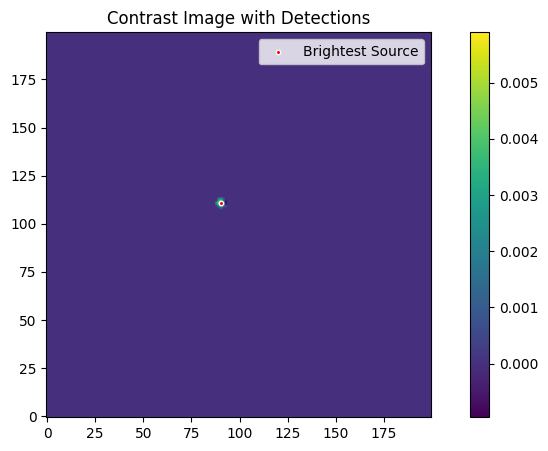

/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)


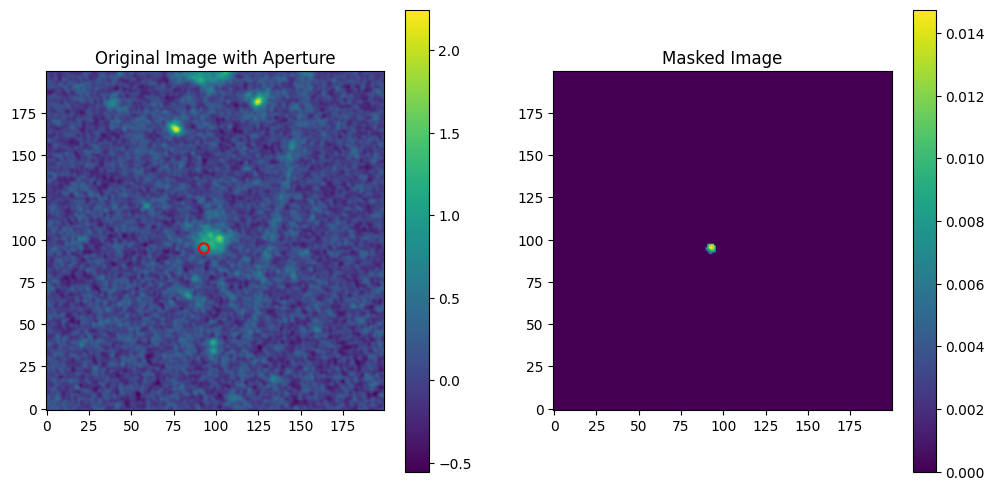

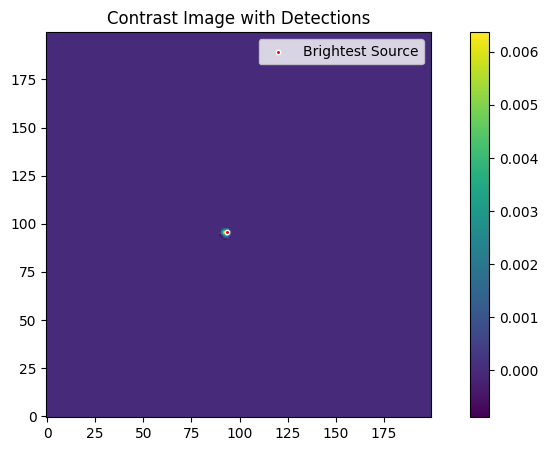

/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)


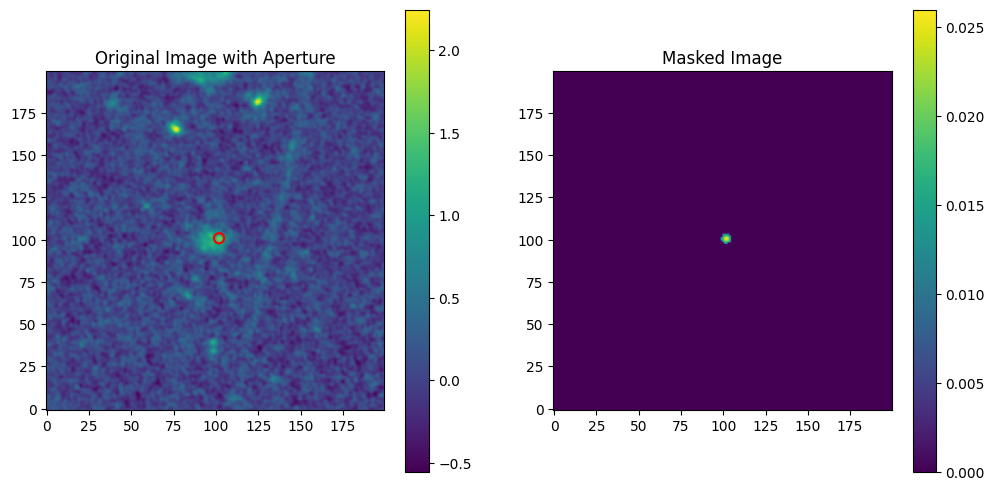

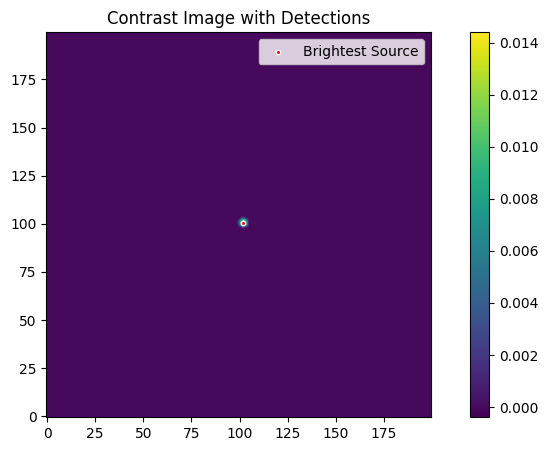

/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)


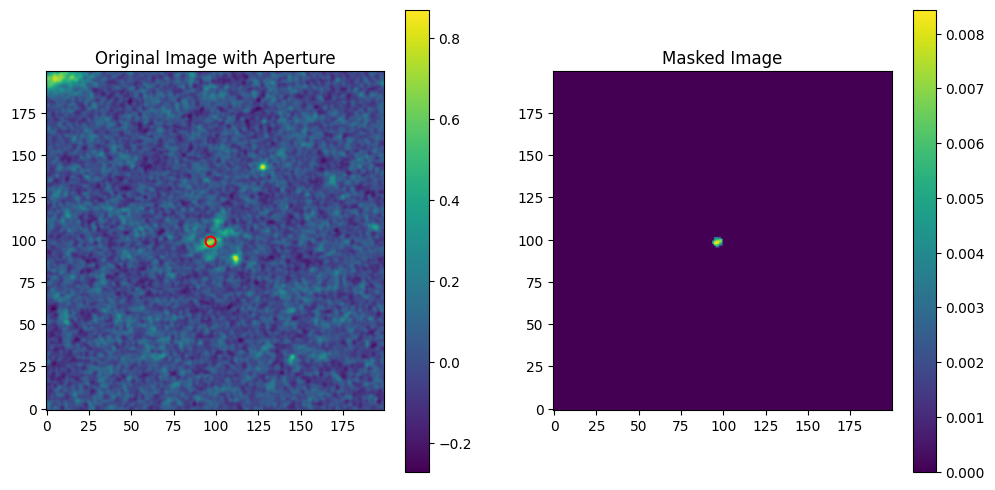

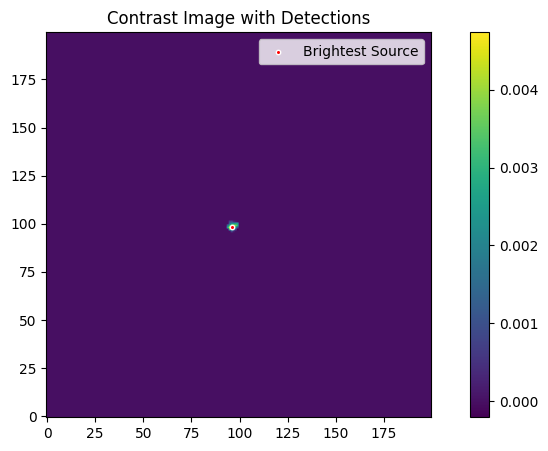

/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)


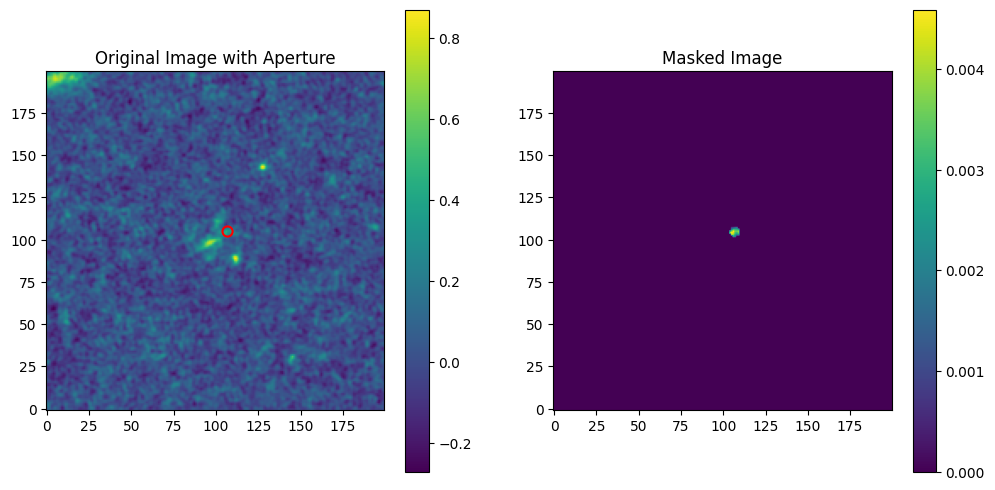

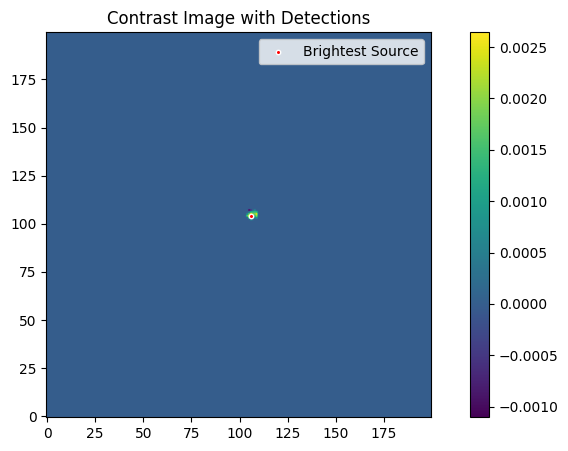

/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)


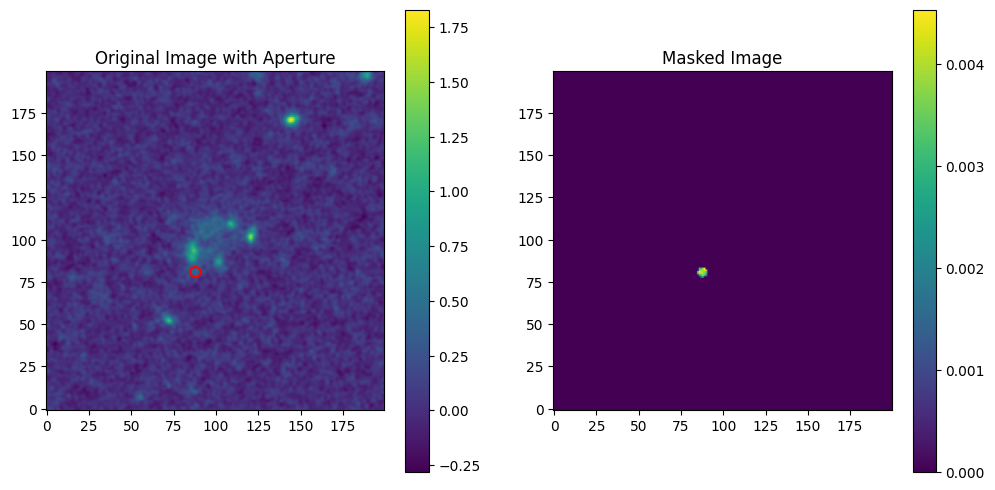

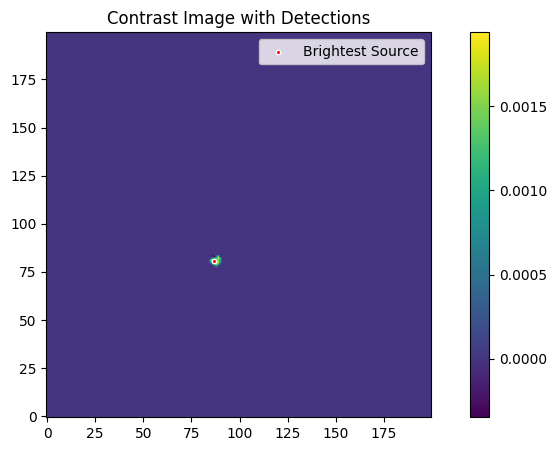

/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)


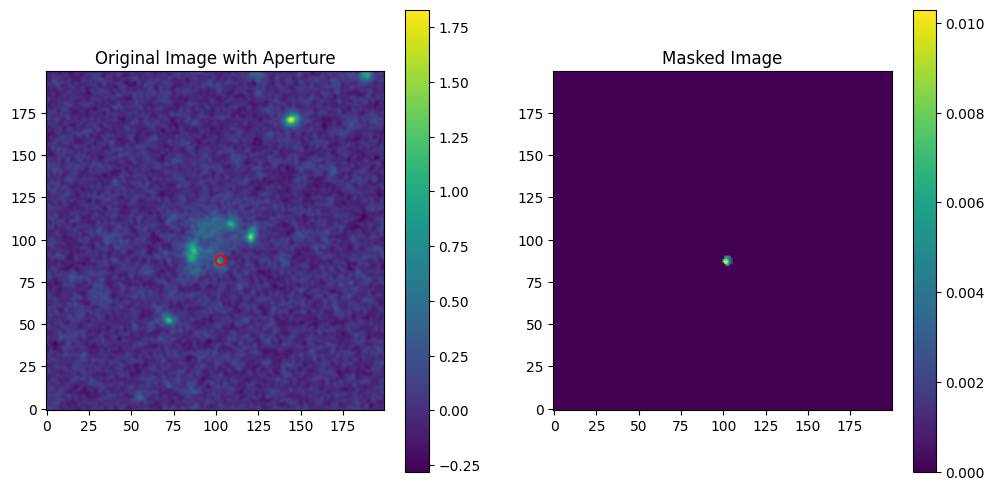

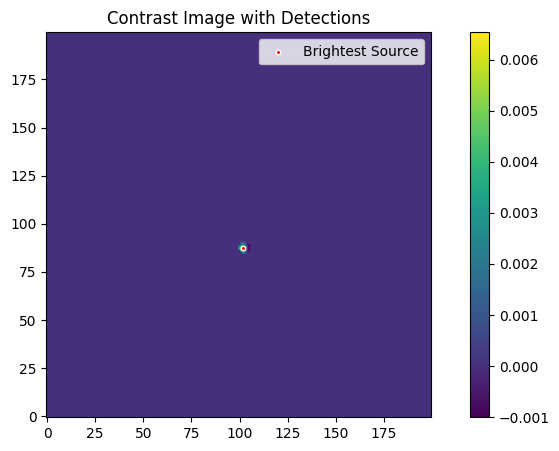

/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)


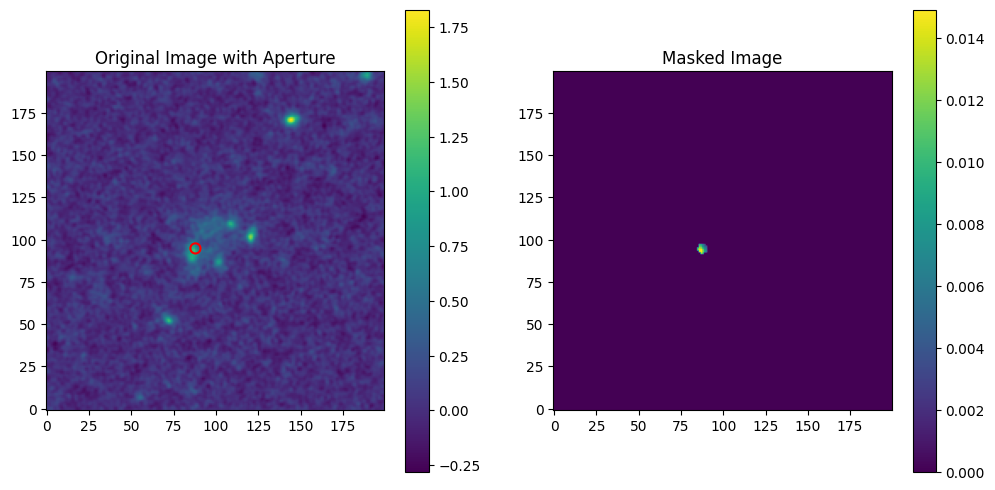

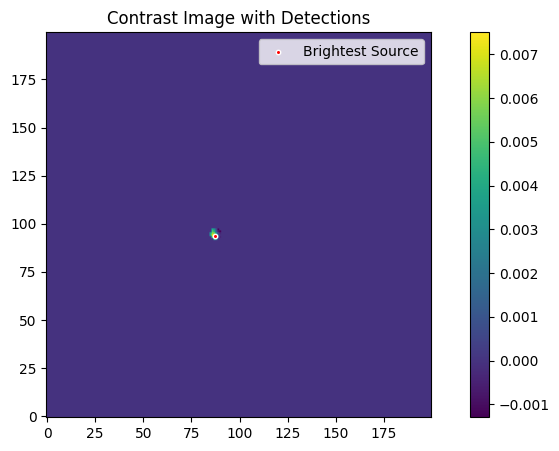

/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)


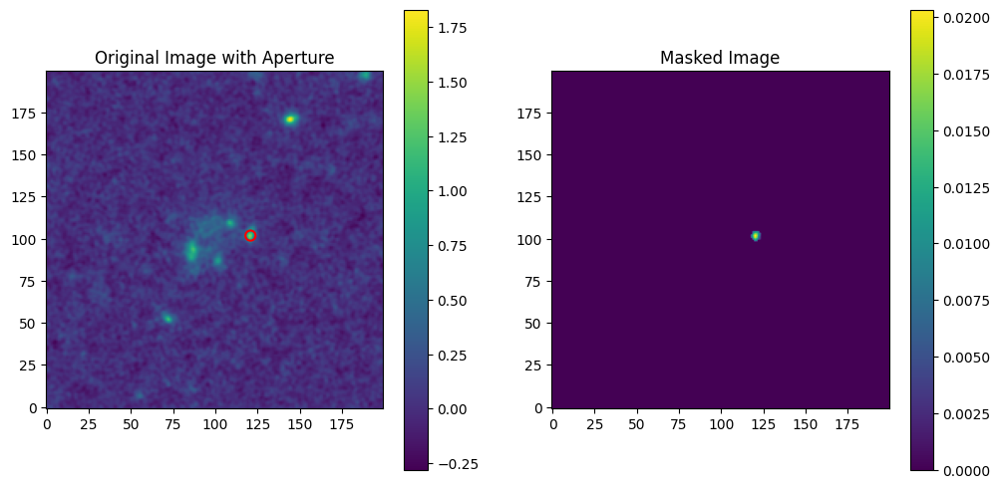

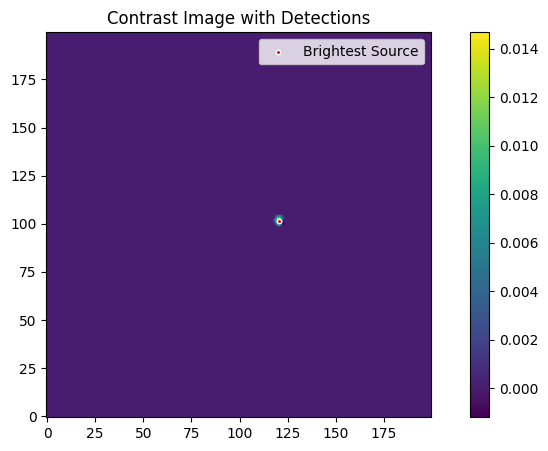

/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)


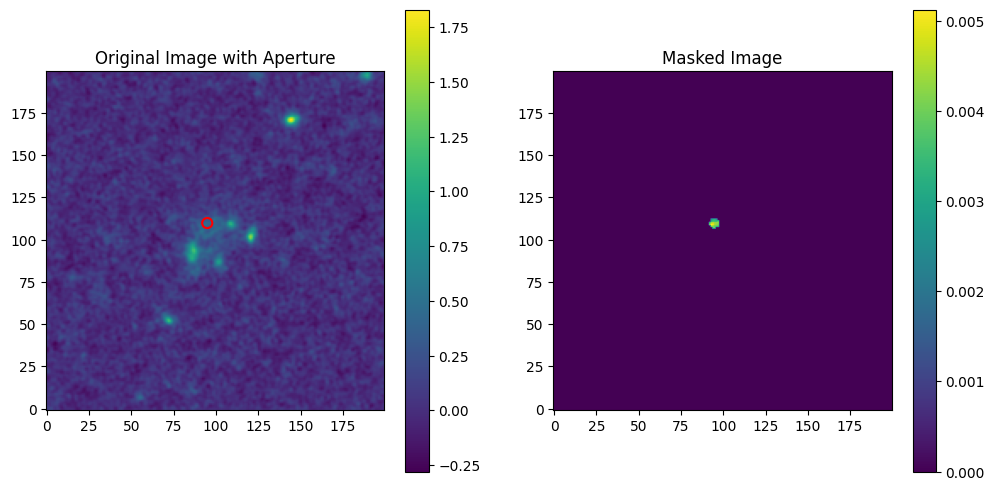

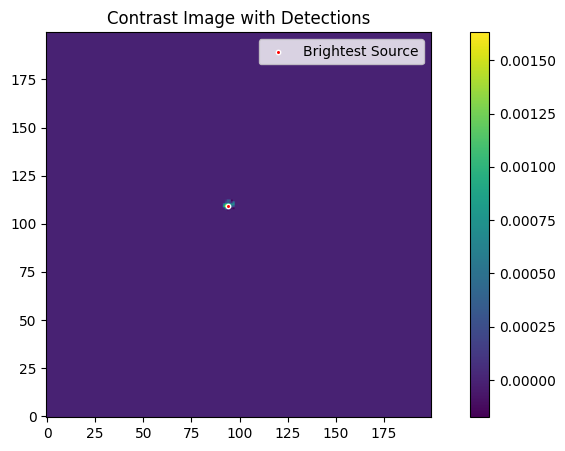

/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)


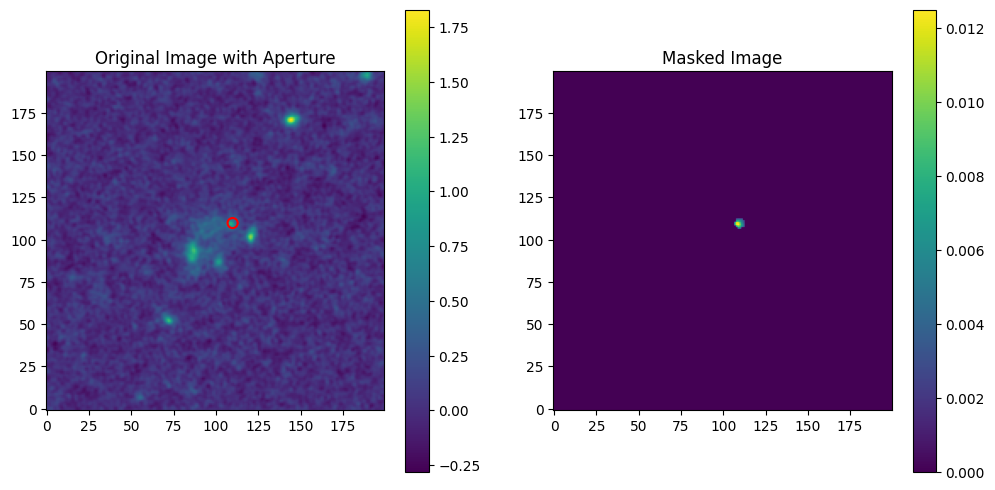

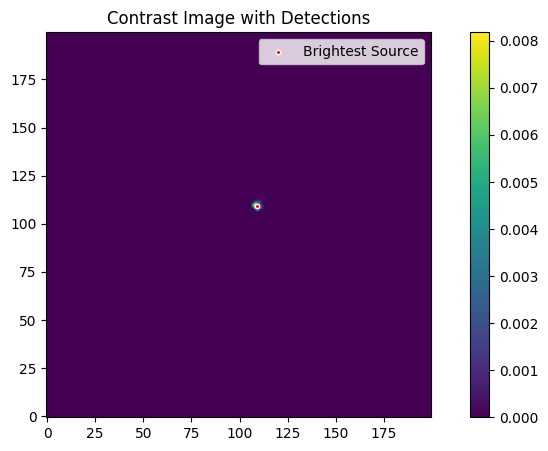

/Users/neal/anaconda3/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)


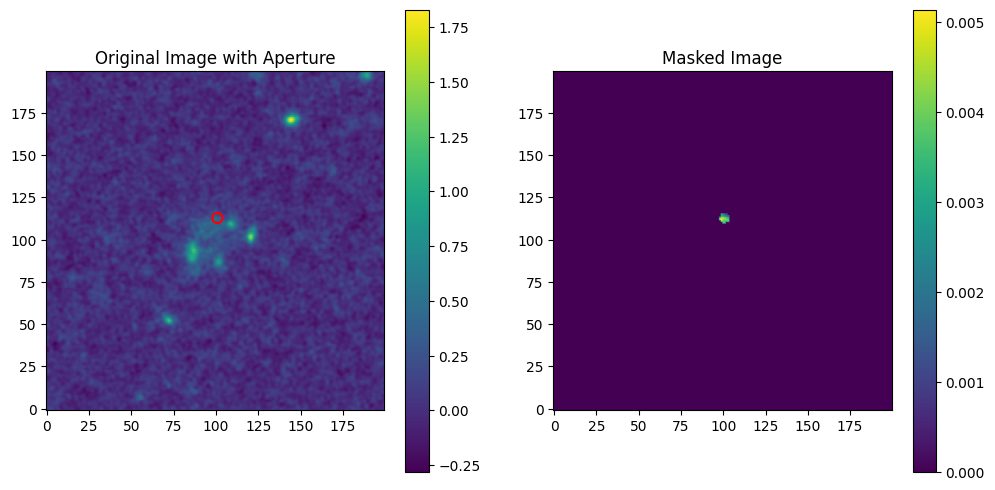

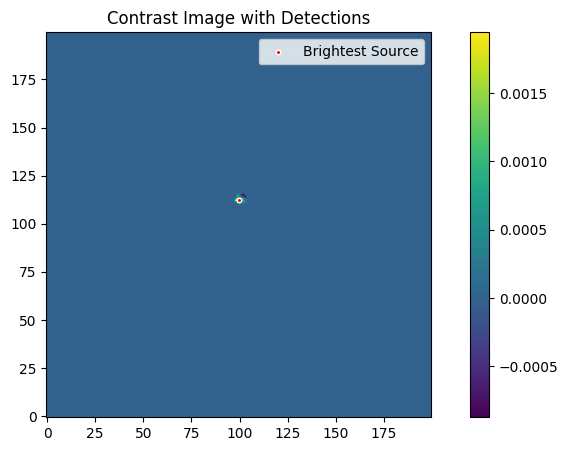

,Unnamed: 0,Field,CANDELS_ID,z,RA_gal,DEC_gal,A,Clump_ID,dist_clump,flux_ratio,restuv_flux,RA_clump,DEC_clump,new_X_centroid,new_Y_centroid
0,0,goodss,18,2.658,53.103527,-27.956482,4.078,1,4.361886,0.223942,0.333196,53.103609,-27.956512,95.725251,98.596811
1,1,goodss,18,2.658,53.103527,-27.956482,4.078,2,6.206130,0.120983,0.333196,53.103571,-27.956396,97.492705,103.899455
2,2,goodss,31,2.667,53.103826,-27.954019,3.839,1,0.720425,0.406089,0.539943,53.103836,-27.954012,99.433067,100.094554
3,3,goodss,31,2.667,53.103826,-27.954019,3.839,2,6.838422,0.100441,0.539943,53.103779,-27.953912,101.265618,105.098161
4,4,goodss,40,1.056,53.088263,-27.954256,7.522,1,13.107481,0.010098,1.373450,53.088024,-27.954326,108.208208,94.481458
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4058,4058,goodss,26763,2.408,53.135199,-27.705983,5.185,-99,-99.000000,-99.000000,-99.000000,-99.000000,-99.000000,NaN,NaN
4059,4059,goodss,26783,2.615,53.150381,-27.706844,6.065,1,7.704078,0.052889,0.742023,53.150339,-27.706978,101.313517,92.890892
4060,4060,goodss,26783,2.615,53.150381,-27.706844,6.065,2,1.644023,0.161235,0.742023,53.150415,-27.706878,98.706059,98.692619
4061,4061,goodss,26783,2.615,53.150381,-27.706844,6.065,3,6.935619,0.166425,0.742023,53.150415,-27.706745,98.438529,105.192628


In [12]:
process_clumps(clump_catalog,base_path)

# Sectioon 2: Photometry on the new X and Y:

### 1)converting New x and y to RA/DEC:

In [2]:
refined_positions_catalog = pd.read_csv('/Users/neal/Documents/PhD/projects/SED-fitting/Clump/results/newcenters_goodsslast.csv')

### 1.1) getting all wcss and then choosing from them to convert x/y:

In [3]:


def load_wcs_for_all_images(base_path, galaxy_ids, bands):
    wcs_dict = {band: {} for band in bands}
    for candels_id in galaxy_ids:
        for band in bands:
            fits_path = f'{base_path}/goodss_{candels_id}_{band}_images.fits'
            if os.path.exists(fits_path):
                print(f"Loading WCS for {fits_path}")
                with fits.open(fits_path) as hdul:
                    wcs = WCS(hdul[0].header)
                    wcs_dict[band][candels_id] = wcs
            else:
                print(f"File does not exist: {fits_path}")
    return wcs_dict

In [6]:
galaxy_ids = refined_positions_catalog['CANDELS_ID'].unique()
bands = ['f125w', 'f140w', 'f160w', 'f275w', 'f435w', 'f606w', 'f775w', 'f850lp']
base_path='/Users/neal/Documents/PhD/projects/SED-fitting/Clump/Cutouts_galaxies'

In [7]:
#  Store the returned WCS dictionary
wcs_dict = load_wcs_for_all_images(base_path, galaxy_ids, bands)

# Now, you can print or inspect the wcs_dict to verify it contains data
print(wcs_dict)

Loading WCS for /Users/neal/Documents/PhD/projects/SED-fitting/Clump/Cutouts_galaxies/goodss_18_f125w_images.fits
Loading WCS for /Users/neal/Documents/PhD/projects/SED-fitting/Clump/Cutouts_galaxies/goodss_18_f140w_images.fits
Loading WCS for /Users/neal/Documents/PhD/projects/SED-fitting/Clump/Cutouts_galaxies/goodss_18_f160w_images.fits
Loading WCS for /Users/neal/Documents/PhD/projects/SED-fitting/Clump/Cutouts_galaxies/goodss_18_f275w_images.fits
Loading WCS for /Users/neal/Documents/PhD/projects/SED-fitting/Clump/Cutouts_galaxies/goodss_18_f435w_images.fits
Loading WCS for /Users/neal/Documents/PhD/projects/SED-fitting/Clump/Cutouts_galaxies/goodss_18_f606w_images.fits
Loading WCS for /Users/neal/Documents/PhD/projects/SED-fitting/Clump/Cutouts_galaxies/goodss_18_f775w_images.fits
Loading WCS for /Users/neal/Documents/PhD/projects/SED-fitting/Clump/Cutouts_galaxies/goodss_18_f850lp_images.fits
Loading WCS for /Users/neal/Documents/PhD/projects/SED-fitting/Clump/Cutouts_galaxies/g

In [8]:
# Example to check for a specific CANDELS_ID in a specific band
candels_id = 18  # Example ID
band = 'f125w'   # Example band
if candels_id in wcs_dict[band]:
    print(f"WCS for CANDELS_ID {candels_id} in band {band} is loaded.")
    print(wcs_dict[band][candels_id])
else:
    print(f"No WCS loaded for CANDELS_ID {candels_id} in band {band}.")


WCS for CANDELS_ID 18 in band f125w is loaded.
WCS Keywords

Number of WCS axes: 2
CTYPE : 'RA---TAN' 'DEC--TAN' 
CRVAL : 53.122751 -27.805089 
CRPIX : -918.5 9184.5 
PC1_1 PC1_2  : -1.666667e-05 0.0 
PC2_1 PC2_2  : 0.0 1.666667e-05 
CDELT : 1.0 1.0 
NAXIS : 200  200


In [9]:


def update_catalog_with_new_coords(updated_clump_catalog, wcs_dict):
    
    new_ra_dec = []

    for index, row in updated_clump_catalog.iterrows():
        band = get_band_from_redshift(row['z'])
        wcs = wcs_dict[band][row['CANDELS_ID']]
        # Convert new centroid positions to celestial coordinates
        ra, dec = wcs.all_pix2world(row['new_X_centroid'], row['new_Y_centroid'], 1)
        new_ra_dec.append((ra, dec))

    # Add new RA and DEC to the DataFrame
    updated_clump_catalog['new_RA'], updated_clump_catalog['new_DEC'] = zip(*new_ra_dec)
    return updated_clump_catalog


In [12]:
# Update your catalog with new RA and DEC
updated_clump_catalog = update_catalog_with_new_coords(refined_positions_catalog, wcs_dict)

# Optional: Check some of the new RA and DEC values
print(updated_clump_catalog[['new_RA', 'new_DEC']])

# Save or continue processing the updated catalog
updated_clump_catalog.to_csv('/Users/neal/Documents/PhD/projects/SED-fitting/Clump/results/RA_DEc_from_newcenters_goodsslast.csv', index=False)

                  new_RA              new_DEC
0     53.103614094127884   -27.95651907410127
1      53.10358076056161   -27.95643069270232
2      53.10384646330619   -27.95402749370081
3      53.10381190116735  -27.953944096069915
4     53.088114639623505   -27.95435133286679
...                  ...                  ...
4058                 nan                  nan
4059   53.15037107692381   -27.70697982099866
4060   53.15042013822366  -27.706883116082025
4061   53.15042514696253  -27.706774781905654
4062                 nan                  nan

[4063 rows x 2 columns]


### 2) doing prev photometry code on the new cat with new RA/DEC:

In [23]:
new_clump_catalog=pd.read_csv('/Users/neal/Documents/PhD/projects/SED-fitting/Clump/results/RA_DEc_from_newcenters_goodsslast.csv')

In [24]:
def automated_photometry(clumps, wcs, science_image,phot_zp, mask_aperture_size=0.24, annulus_inner=0.24, annulus_outer=0.36):
    results = []

    # Convert the science image to a floating point array if not already
    science_image = np.array(science_image, dtype=float)

    # Iterates over each clump
    for index, target_clump in clumps.iterrows():
        # Check if the target clump has valid coordinates. Skips processing if the DEC value of the clump is set to a (-99.0), 
        # which indicates invalid or missing data.
        if target_clump['new_DEC'] == -99.0:
            print(f"Skipping clump due to invalid coordinates: {target_clump['CANDELS_ID']}, {target_clump['Clump_ID']}")
            continue

        # Converts the RA and DEC of the target clump to a SkyCoord object
        target_coords = SkyCoord(ra=target_clump['new_RA']*u.degree, dec=target_clump['new_DEC']*u.degree)

        # Creates a copy of the original image to mask out other clumps, 
        # so that they do not affect the photometry of the target clump.
        science_image_masked = np.copy(science_image)

        # Mask other clumps only if more than one clump is present, (by setting their pixel values to 0)
        if len(clumps) > 1:
            for _, other_clump in clumps.drop(index).iterrows():
                other_coords = SkyCoord(ra=other_clump['new_RA']*u.degree, dec=other_clump['new_DEC']*u.degree)
                mask_aperture = SkyCircularAperture(other_coords, r=mask_aperture_size*u.arcsec).to_pixel(wcs)
                mask = mask_aperture.to_mask(method='center')
                # Generates slices for numpy array indexing using the bounding box of the mask.
                bbox_slices = (slice(mask.bbox.iymin, mask.bbox.iymax), slice(mask.bbox.ixmin, mask.bbox.ixmax))
                # Accesses the section of the image to mask out.
                science_image_masked_section = science_image_masked[bbox_slices]
                mask_data = mask.data.astype(bool)
                # Applies the mask to the image 
                science_image_masked_section[mask_data] = 0
                science_image_masked[bbox_slices] = science_image_masked_section
            # #plot mask
            # plt.imshow(science_image_masked)
            # plt.show()


        # Perform photometry on the target clump
        target_aperture = SkyCircularAperture(target_coords, r=0.18*u.arcsec).to_pixel(wcs)
        photometry = aperture_photometry(science_image_masked, target_aperture)

        # Check if photometry result is unexpected!(We get this since some images in some bands are just black)
        if photometry['aperture_sum'][0] == 0:
            print(f"Zero flux detected for clump: {target_clump['CANDELS_ID']}, {target_clump['Clump_ID']}")
            

        # Background subtraction
        annulus_aperture = SkyCircularAnnulus(target_coords, r_in=annulus_inner*u.arcsec, r_out=annulus_outer*u.arcsec).to_pixel(wcs)
        background = aperture_photometry(science_image_masked, annulus_aperture)
        area_annulus = annulus_aperture.area
        # Calculates the average background flux per pixel within the annulus
        background_per_pixel = background['aperture_sum'][0] / area_annulus
        # Scales the average background to the aperture size
        total_background_light = background_per_pixel * target_aperture.area
        corrected_flux = 1.5 *(photometry['aperture_sum'][0] - total_background_light) # aperture correction



        raw_flux_mjy = (photometry['aperture_sum'][0] * phot_zp) * 1e6  # Convert from Jy to μJy
        background_flux_mjy = (total_background_light * phot_zp) * 1e6
        corrected_flux_mjy = (corrected_flux * phot_zp) * 1e6

        # Appends the results for this clump 
        results.append({
            'CANDELS_ID': target_clump['CANDELS_ID'],
            'Clump_ID': target_clump['Clump_ID'],
            'Raw_Flux_mjy': raw_flux_mjy,
            'Background_Flux_mjy': background_flux_mjy,
            'Corrected_Flux_mjy': corrected_flux_mjy
        })
    # Converts the results list into a DataFrame
    return pd.DataFrame(results)


In [27]:
import os

# List of bands 
bands = ['f125w', 'f140w', 'f160w', 'f275w', 'f435w', 'f606w', 'f775w', 'f850lp']

# Initialize a dictionary to hold the WCS objects and science image data for each band
wcs_dict = {band: {} for band in bands}
image_data_dict = {band: {} for band in bands}
phot_zp_dict ={band: {} for band in bands}

# Populate the dictionaries with WCS and image data for each band and galaxy
#for candels_id in new_clump_catalog['CANDELS_ID'].unique():

    # if candels_id < 20000:
    #     pass
    # else:
    #     continue

    # for band in bands:
    #     fits_path = f'/Users/neal/Documents/PhD/projects/SED-fitting/Clump/Cutouts_galaxies/goodss_{candels_id}_{band}_images.fits'
        
        # # Check if the FITS file exists
        # if os.path.exists(fits_path):
        #     # with fits.open(fits_path) as hdul:
        #     hdul= fits.open(fits_path)
        
        #     wcs_dict[band][candels_id] = WCS(hdul[0].header)
            
        #     image_data_dict[band][candels_id] = hdul[0].data
        #     hdul.close()
        
        #     # Read the conversion factor from the header
        #     if 'PHOT_ZP' in hdul[0].header:
        #         phot_zp_dict[band][candels_id] = hdul[0].header['PHOT_ZP']
        #     else:
        #         print(f"PHOT_ZP keyword not found in header of {fits_path}. Using default value.")
                
        #         phot_zp_dict[(candels_id, band)] = phot_zp

# Perform photometry for each band and galaxy, and add results to the catalog
for candels_id in new_clump_catalog['CANDELS_ID'].unique():
    galaxy_clumps = new_clump_catalog[(new_clump_catalog['CANDELS_ID'] == candels_id) & (new_clump_catalog['new_RA'] <= 90) & (new_clump_catalog['new_DEC'] >= -90)].copy()
    
    for band in bands:
        fits_path = f'/Users/neal/Documents/PhD/projects/SED-fitting/Clump/Cutouts_galaxies/goodss_{candels_id}_{band}_images.fits'
        
        # Check if the galaxy has data in this band
        #if candels_id in wcs_dict[band] and candels_id in image_data_dict[band]:

        hdul= fits.open(fits_path)
        
        wcs = WCS(hdul[0].header)
            
        science_image = hdul[0].data

        phot_zp = hdul[0].header['PHOT_ZP']
        hdul.close()
            
        #wcs = wcs_dict[band][candels_id]
        #science_image = image_data_dict[band][candels_id]
        #phot_zp = phot_zp_dict[band][candels_id]  # Get the photometric zero point for the current band and galaxy
            
            
        # Check if the science image is not empty or  black
        if not np.all(science_image == 0):
            photometry_results = automated_photometry(galaxy_clumps, wcs, science_image,phot_zp)
            
            #  Update the original clump_catalog with the converted flux results
            for index, row in photometry_results.iterrows():
                mask = (new_clump_catalog['CANDELS_ID'] == row['CANDELS_ID']) & (new_clump_catalog['Clump_ID'] == row['Clump_ID'])
                new_clump_catalog.loc[mask, f'Raw_Flux_{band}_mjy'] = row['Raw_Flux_mjy']
                new_clump_catalog.loc[mask, f'Background_Flux_{band}_mjy'] = row['Background_Flux_mjy']
                new_clump_catalog.loc[mask, f'Corrected_Flux_{band}_mjy'] = row['Corrected_Flux_mjy']

# Save the updated clump catalog with photometry results
new_clump_catalog.to_csv('/Users/neal/Documents/PhD/projects/SED-fitting/Clump/results/complete_new_ra_dec_photometry_aperture_corrected.csv', index=False)


Zero flux detected for clump: 18, 1
Zero flux detected for clump: 18, 2
Zero flux detected for clump: 172, 1
Zero flux detected for clump: 263, 1
Zero flux detected for clump: 263, 2
Zero flux detected for clump: 263, 3
Zero flux detected for clump: 3575, 1
Zero flux detected for clump: 3575, 4
Zero flux detected for clump: 3776, 1
Zero flux detected for clump: 3776, 2
Zero flux detected for clump: 4866, 1
Zero flux detected for clump: 4866, 2
Zero flux detected for clump: 4866, 1
Zero flux detected for clump: 4866, 2
Zero flux detected for clump: 4866, 1
Zero flux detected for clump: 4866, 2
Zero flux detected for clump: 4866, 1
Zero flux detected for clump: 4866, 2
Zero flux detected for clump: 4866, 1
Zero flux detected for clump: 4866, 2
Zero flux detected for clump: 4866, 1
Zero flux detected for clump: 4866, 2
Zero flux detected for clump: 4866, 1
Zero flux detected for clump: 4866, 2
Zero flux detected for clump: 4866, 1
Zero flux detected for clump: 4866, 2
Zero flux detected f

# Section 3: Finding new Flux ratio/ Dist clump

### 1) Dist from center of galaxy:seperation way

In [28]:
catalog= pd.read_csv('/Users/neal/Documents/PhD/projects/SED-fitting/Clump/results/complete_new_ra_dec_photometry_aperture_corrected.csv')

In [29]:
# Initialize a list to store angular separations
separations = []

# Loop over each row in the catalog
for idx, row in catalog.iterrows():
    # Create SkyCoord objects for the clump and the galaxy
    clump_coord = SkyCoord(ra=row['new_RA'] * u.degree, dec=row['new_DEC'] * u.degree)
    galaxy_coord = SkyCoord(ra=row['RA_gal'] * u.degree, dec=row['DEC_gal'] * u.degree)

    # Calculate the angular separation and convert to arcseconds
    separation = clump_coord.separation(galaxy_coord)
    separations.append(separation.arcsecond)

# Add the separations as a new column to the DataFrame
catalog['angular_separation_arcsec'] = separations

# Save the updated catalog
catalog.to_csv('/Users/neal/Documents/PhD/projects/SED-fitting/Clump/results/complete_new_ra_dec_photometry_aperture_corrected_seperation_added.csv', index=False)

### 1.2) dist from galaxy:Eucledian way:

In [30]:
# Just make sure abt cutout sizes
from astropy.io import fits
# tried a bunch of them,same result
catalog= pd.read_csv('/Users/neal/Documents/PhD/projects/SED-fitting/Clump/results/new_ra_dec_photometry_aperture_corrected_seperation_added.csv')
fits_file = '/Users/neal/Documents/PhD/projects/SED-fitting/Clump/Cutouts_galaxies/goodss_219_f850lp_images.fits'
with fits.open(fits_file) as hdul:
    header = hdul[0].header
    print("Image dimensions:", header['NAXIS1'], 'x', header['NAXIS2'])


Image dimensions: 200 x 200


In [31]:

# Load your catalog
catalog = pd.read_csv('/Users/neal/Documents/PhD/projects/SED-fitting/Clump/results/complete_new_ra_dec_photometry_aperture_corrected_seperation_added.csv')

image_size = 200  # Assuming all images are 200x200 pixels

# Iterate over the catalog to calculate distances
for index, row in catalog.iterrows():
    x_center = image_size / 2
    y_center = image_size / 2
    distance_pixel = np.sqrt((row['new_X_centroid'] - x_center)**2 + (row['new_Y_centroid'] - y_center)**2)
    catalog.loc[index, 'distance_pixel'] = distance_pixel

# Define the path to save the updated catalog
save_path = '/Users/neal/Documents/PhD/projects/SED-fitting/Clump/results/complete_new_ra_dec_photometry_aperture_corrected_seperation_added_euclidean_added.csv'

# Check if the directory exists, if not, create it
os.makedirs(os.path.dirname(save_path), exist_ok=True)

# Save the updated catalog
catalog.to_csv(save_path, index=False)


### 2) Flux ratio:

 flux ratio (Divide by restuv flux)

In [32]:
catalog =pd.read_csv('/Users/neal/Documents/PhD/projects/SED-fitting/Clump/results/complete_new_ra_dec_photometry_aperture_corrected_seperation_added_euclidean_added.csv')
# Add a new column for the flux ratio
catalog['new_flux_ratio'] = pd.Series(dtype=float)

# Iterate over each row in the catalog to calculate the flux ratio
for index, row in catalog.iterrows():
    band = get_band_from_redshift(row['z'])
    clump_flux_column = f'Corrected_Flux_{band}_mjy'  
    if clump_flux_column in catalog.columns:
        galaxy_uv_flux = row['restuv_flux']
        clump_flux = row[clump_flux_column]
        
        # Calculate the flux ratio if galaxy UV flux is not zero or NaN
        if galaxy_uv_flux > 0:
            catalog.loc[index, 'new_flux_ratio'] = clump_flux / galaxy_uv_flux
        else:
            catalog.loc[index, 'new_flux_ratio'] = float('nan')  # Handle division by zero or undefined UV flux

# Save the updated catalog with the new flux ratio column
catalog.to_csv('/Users/neal/Documents/PhD/projects/SED-fitting/Clump/results/complete_new_ra_dec_photometry_aperture_corrected_seperation_added_euclid_fluxratio_added.csv', index=False)